# Libraries

In [1]:
import numpy as np
import pandas as pd
from pandas import Series, DataFrame
import seaborn as sb
import matplotlib.pyplot as plt
from collections import Counter
from pylab import rcParams
from datetime import datetime
from datetime import date
from scipy.stats import ttest_ind

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, AffinityPropagation
from sklearn.metrics import silhouette_samples, silhouette_score

from mpl_toolkits.mplot3d import Axes3D

import warnings
warnings.filterwarnings('ignore')

In [2]:
%matplotlib inline
rcParams['figure.figsize'] = 30, 8
rcParams["axes.labelsize"] = 20
sb.set_style('whitegrid')
sb.set(font_scale = 1.5)

# Datasets: Overview and Basic Cleaning

## Accounts Dataset

In [3]:
df_accts=pd.read_csv('BusinessCase_Accts.csv')
df_accts.drop(df_accts.columns[[0]], axis = 1, inplace = True)
df_accts.head()

,branchNumber,type,openDate,id,iban,balance,currency,cust_id
0,1416,DDA,3/1/2018,fe51c153-fbec-4b64-9b00-2530035ef0e1_1894a538-...,NaN,447.56,CAD,fe51c153-fbec-4b64-9b00-2530035ef0e1_c418b5e6-...
1,1416,SDA,3/1/2018,fe51c153-fbec-4b64-9b00-2530035ef0e1_e4d4cce1-...,NaN,4592.68,CAD,fe51c153-fbec-4b64-9b00-2530035ef0e1_c418b5e6-...
2,324,DDA,3/1/2018,fe51c153-fbec-4b64-9b00-2530035ef0e1_b4c1aad5-...,NaN,4132.75,CAD,fe51c153-fbec-4b64-9b00-2530035ef0e1_be23d561-...
3,324,SDA,3/1/2018,fe51c153-fbec-4b64-9b00-2530035ef0e1_f71001df-...,NaN,2110.26,CAD,fe51c153-fbec-4b64-9b00-2530035ef0e1_be23d561-...
4,1728,DDA,3/1/2018,fe51c153-fbec-4b64-9b00-2530035ef0e1_ec10146d-...,NaN,16981.85,CAD,fe51c153-fbec-4b64-9b00-2530035ef0e1_9ed43d58-...


In [4]:
(df_accts[df_accts.duplicated()]).shape[0]   #checking for duplicate rows

0

In [5]:
(df_accts[df_accts.duplicated(subset=['id'])]).shape[0]  #checking for duplicate accounts/id

0

In [6]:
print(df_accts.info())   #general info such as data type and null value of each of column/variable

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11290 entries, 0 to 11289
Data columns (total 8 columns):
branchNumber    11290 non-null int64
type            11290 non-null object
openDate        11290 non-null object
id              11290 non-null object
iban            0 non-null float64
balance         11290 non-null float64
currency        11290 non-null object
cust_id         11290 non-null object
dtypes: float64(2), int64(1), object(5)
memory usage: 705.7+ KB
None


In [7]:
df_accts.drop(['iban'], axis=1, inplace=True)     #dropping the column iban since it is empty

df_accts["branchNumber"]= df_accts["branchNumber"].astype(str) #converting the data type of branchNumber to str

## Customers Dataset

In [8]:
df_custs=pd.read_csv('BusinessCase_Custs.csv')
df_custs.drop(df_custs.columns[[0]], axis = 1, inplace = True)
df_custs.head()

,id,type,gender,birthDate,workActivity,occupationIndustry,totalIncome,relationshipStatus,habitationStatus,addresses_principalResidence_province,schoolAttendance,schools
0,fe51c153-fbec-4b64-9b00-2530035ef0e1_1bf5af3c-...,Personal,Male,12/26/1985,NaN,NaN,0.0,Single,Group,ON,NaN,NaN
1,fe51c153-fbec-4b64-9b00-2530035ef0e1_6e740a94-...,Personal,Female,1/30/1977,fulltime,5221 Depository credit intermediation,40009.2,Married,With Spouse,ON,NaN,NaN
2,fe51c153-fbec-4b64-9b00-2530035ef0e1_3918fdef-...,Personal,Female,11/22/2003,NaN,NaN,0.0,Single,With Parent,ON,Secondary,1.0
3,fe51c153-fbec-4b64-9b00-2530035ef0e1_d81a6d15-...,Personal,Other,5/7/1983,fulltime,"5412 Accounting, tax preparation, bookkeeping ...",44709.0,Married,With Spouse,ON,NaN,NaN
4,fe51c153-fbec-4b64-9b00-2530035ef0e1_e21dfbc8-...,Personal,Male,1/29/1983,fulltime,4855 Charter bus industry,21496.0,Single,With Parent,ON,NaN,NaN


In [9]:
(df_custs[df_custs.duplicated()]).shape[0]  #checking for duplicate rows

0

In [10]:
(df_custs[df_custs.duplicated(subset=['id'])]).shape[0]  #checking for duplicate customers/id

0

In [11]:
print(df_custs.info())   #general info such as data type and null value of each of column/variable

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5645 entries, 0 to 5644
Data columns (total 12 columns):
id                                       5645 non-null object
type                                     5645 non-null object
gender                                   5645 non-null object
birthDate                                5645 non-null object
workActivity                             4200 non-null object
occupationIndustry                       4915 non-null object
totalIncome                              5645 non-null float64
relationshipStatus                       5645 non-null object
habitationStatus                         4662 non-null object
addresses_principalResidence_province    5645 non-null object
schoolAttendance                         1582 non-null object
schools                                  391 non-null float64
dtypes: float64(2), object(10)
memory usage: 529.3+ KB
None


In [12]:
df_custs['birthDate'] = pd.to_datetime(df_custs['birthDate'])  #converting the data type of birthDate to date

## Transactions Dataset

In [13]:
df_tx=pd.read_csv('BusinessCase_Tx.csv')
df_tx.drop(df_tx.columns[[0]], axis = 1, inplace = True)
df_tx.head()

,description,currencyAmount,locationRegion,locationCity,originationDateTime,customerId,merchantId,accountId,categoryTags
0,ADP PMT 59964899,1092.22,NaN,NaN,2018-06-28T00:00:00.001Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_fa967441-...,NaN,fe51c153-fbec-4b64-9b00-2530035ef0e1_5b35142d-...,Income
1,ADP PMT 78870688,701.11,NaN,NaN,2018-06-28T00:00:00.001Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_ee129e70-...,NaN,fe51c153-fbec-4b64-9b00-2530035ef0e1_9172eb97-...,Income
2,ROGERS CABLE E2I6X9,111.98,NaN,NaN,2018-04-30T00:00:00.002Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_ad635ae8-...,3d99af81-c081-4d73-bc44-d3a8e639b22a,fe51c153-fbec-4b64-9b00-2530035ef0e1_b527eb36-...,Bills and Utilities
3,TIM HORTONS #990 _F,1.16,NaN,NaN,2018-10-09T15:30:00Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_12bd4e47-...,7cc23aa6-0671-4c44-a1b5-b8a98d4bc5d4,fe51c153-fbec-4b64-9b00-2530035ef0e1_1185d0e2-...,Food and Dining
4,EMAIL TFR C0***oHp,41.00,NaN,NaN,2018-07-05T00:00:00.001Z,fe51c153-fbec-4b64-9b00-2530035ef0e1_fb97a9de-...,NaN,fe51c153-fbec-4b64-9b00-2530035ef0e1_bf889f32-...,Transfer


In [14]:
(df_tx[df_tx.duplicated()]).shape[0]   #checking for duplicate rows

135

In [15]:
df_tx.drop_duplicates(inplace=True)  #drop duplicate rows/transactions

In [16]:
print(df_tx.info())   #general info such as data type and null value of each of column/variable

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92169 entries, 0 to 92303
Data columns (total 9 columns):
description            92169 non-null object
currencyAmount         92169 non-null float64
locationRegion         0 non-null float64
locationCity           0 non-null float64
originationDateTime    92169 non-null object
customerId             92169 non-null object
merchantId             43298 non-null object
accountId              92169 non-null object
categoryTags           92025 non-null object
dtypes: float64(3), object(6)
memory usage: 7.0+ MB
None


In [17]:
df_tx.drop(['locationRegion','locationCity'], axis=1, inplace=True)  #dropping the column locationRegion and location City since they are empty

df_tx['originationDateTime'] = pd.to_datetime(df_tx['originationDateTime'])  #converting the data type of originationDateTime to date

#  Data Manipulation

## Branch with the most number of customers

In [18]:
unique_branch_cust = df_accts.drop_duplicates(subset=['branchNumber', 'cust_id'])
MostCustBranch = Counter(unique_branch_cust.branchNumber).most_common(1)
print("The branch with the most number of customers is branch", MostCustBranch[0][0], "with",MostCustBranch[0][1], "customers")

The branch with the most number of customers is branch 1029 with 151 customers


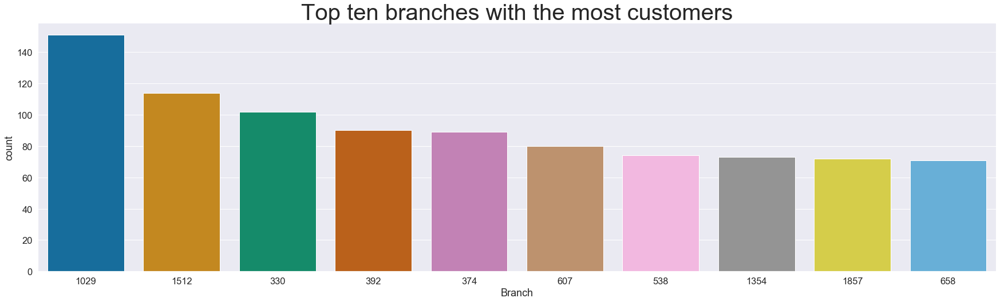

In [19]:
topten=sb.countplot(x='branchNumber', data=unique_branch_cust, palette='colorblind', 
             order=unique_branch_cust.branchNumber.value_counts().iloc[:10].index)
topten.set_title("Top ten branches with the most customers", fontsize=40)
topten.set_xlabel("Branch");

## Oldest Customer as of 2019-07-01

In [20]:
idOldest=df_custs[df_custs['birthDate'] == min(df_custs['birthDate'])]['id']
ageDays=(datetime.strptime('2019-7-1', "%Y-%m-%d") - min(df_custs['birthDate'])).days
ageYear=round(ageDays/365.25)

print('The oldest customer is', ageYear, 'years/', ageDays, 'days old as of 2019-07-01, is the customer with the id ', 
      list(idOldest), ', and was born on', min(df_custs['birthDate']).date(), '.')

The oldest customer is 107 years/ 38968 days old as of 2019-07-01, is the customer with the id  ['fe51c153-fbec-4b64-9b00-2530035ef0e1_522519ff-5e56-4d8a-9888-560f2cde4938'] , and was born on 1912-10-22 .


## Number of accounts of the oldest customer

In [21]:
idOldest=df_custs[df_custs['birthDate'] == min(df_custs['birthDate'])]['id']
print('The oldest customer has', (df_accts[df_accts['cust_id']==list(idOldest)[0]]).shape[0], 'account(s).')

The oldest customer has 2 account(s).


## Number of transactions that went to Starbucks in April

In [22]:
print((df_tx[(df_tx['originationDateTime'].dt.month==4) & (df_tx['description'].str.contains('STARBUCKS'))]).shape[0],
      'transactions went to Starbucks in April.')

395 transactions went to Starbucks in April.


## Amount spent on Starbucks in April

In [23]:
print('The amount spent on Starbucks in April is',
      df_tx[(df_tx['originationDateTime'].dt.month==4) & (df_tx['description'].str.contains('STARBUCKS'))]['currencyAmount'].sum(),
      'CAD.')

The amount spent on Starbucks in April is 1720.87 CAD.


## Hypothesis Testing: Is the average spent at Starbucks (statistically) significantly different in April compared to June?

### We will use t-test to answer this question. 

Null hypothesis: the average spent at Starbucks in April is the same compared to June. In other words, the average spent at Starbucks is not (statistically) significantly different in April compared to June.

Alternative hypothesis: the average spent at Starbucks is (statistically) significantly different in April compared to June.

 #### Getting the two samples

In [24]:
StarbucksApril=df_tx[(df_tx['originationDateTime'].dt.month==4) & (df_tx['description'].str.contains('STARBUCKS'))][['currencyAmount']]
StarbucksJune=df_tx[(df_tx['originationDateTime'].dt.month==6) & (df_tx['description'].str.contains('STARBUCKS'))][['currencyAmount']]

#### Testing the assumptions

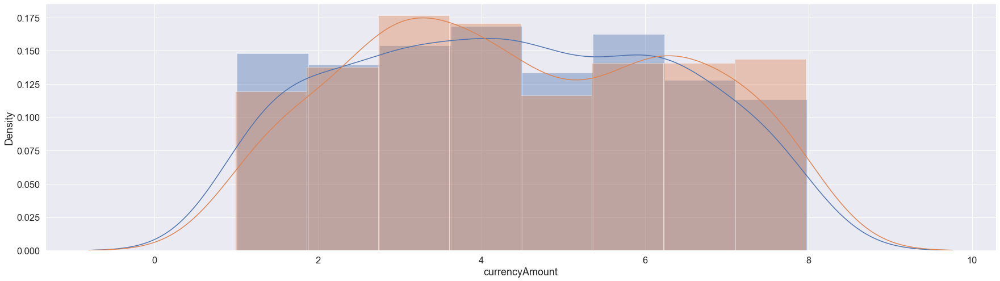

In [25]:
sb.distplot(StarbucksApril['currencyAmount'])
sb.distplot(StarbucksJune['currencyAmount']);

In [26]:
np.var(StarbucksApril['currencyAmount'])

3.814736257651016

In [27]:
np.var(StarbucksJune['currencyAmount'])

3.852711383948347

Although not normally distributed, both samples are unimodal and have similar variances.

#### t-test

In [28]:
stat, p = ttest_ind(StarbucksApril['currencyAmount'], StarbucksJune['currencyAmount'])
print('t =', stat)
print('p =', p)

t = -1.0086329822862352
p = 0.3134650795618261


#### Conclusion: Since p>0.05, we fail to reject the null hypothesis. Hence, the average spent at Starbucks in April is the same compared to June.  In other words, the average spent at Starbucks is not (statistically) significantly different in April compared to June.

##  Date exhibiting the highest average spent above trend at Starbucks (based on a 10-period moving average)


#### Extracting the date and amount spent at Startbucks from the transactions dataset

In [29]:
sbks_tx = df_tx[df_tx['description'].str.contains('STARBUCKS')][['originationDateTime','currencyAmount']]
sbks_tx['originalDate'] = sbks_tx['originationDateTime'].dt.date
sbks_tx.drop(['originationDateTime'], axis=1, inplace=True)
sbks_tx.head()

,currencyAmount,originalDate
54,3.11,2018-05-30
61,2.74,2018-05-30
89,5.74,2018-06-07
117,5.40,2018-04-03
142,3.63,2018-08-08


#### Aggregating (mean) and sorting by date of transaction

In [30]:
sbks_tx_agg = pd.DataFrame(sbks_tx.groupby(['originalDate']).mean()).sort_values(by=['originalDate'])
sbks_tx_agg.reset_index(level=0, inplace=True)
sbks_tx_agg.rename(columns={'currencyAmount': 'averageSpent'}, inplace=True)
sbks_tx_agg.head()

,originalDate,averageSpent
0,2018-04-03,4.047083
1,2018-04-04,5.368966
2,2018-04-05,5.187647
3,2018-04-06,3.759655
4,2018-04-10,4.402273


#### Computing the average spent above trend based on a 10-period moving average

In [31]:
sbks_tx_agg['averageAboveTrend'] = sbks_tx_agg['averageSpent'] - sbks_tx_agg.iloc[:,1].rolling(window=10).mean()
sbks_tx_agg.head(20)

,originalDate,averageSpent,averageAboveTrend
0,2018-04-03,4.047083,NaN
1,2018-04-04,5.368966,NaN
2,2018-04-05,5.187647,NaN
3,2018-04-06,3.759655,NaN
4,2018-04-10,4.402273,NaN
5,2018-04-11,4.706786,NaN
6,2018-04-12,4.465185,NaN
7,2018-04-13,4.505200,NaN
8,2018-04-17,4.381667,NaN
9,2018-04-18,4.144231,-0.352638


In [32]:
bestDate=sbks_tx_agg[sbks_tx_agg['averageAboveTrend'] == np.nanmax(sbks_tx_agg['averageAboveTrend'])]['originalDate']
print('The date exhibiting the highest average spent above trend is', list(bestDate)[0])

The date exhibiting the highest average spent above trend is 2018-10-18


# Business Case

## Merchant category to focus on for new product

#### Frequency and average amount spent for each merchant category

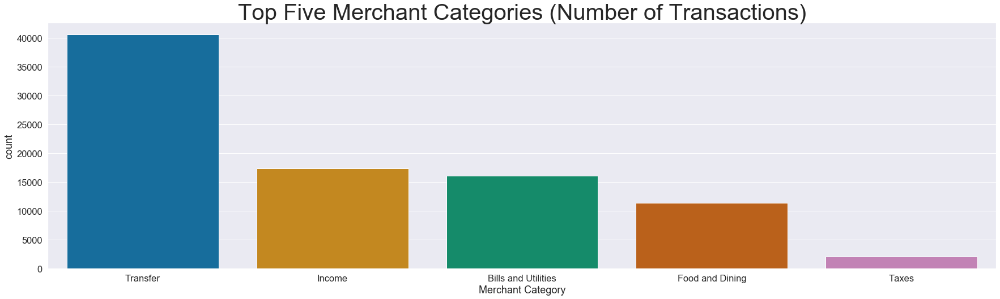

In [33]:
topCat=sb.countplot(x='categoryTags', data=df_tx, palette='colorblind', 
             order=df_tx.categoryTags.value_counts().iloc[:5].index)
topCat.set_title("Top Five Merchant Categories (Number of Transactions)", fontsize=40)
topCat.set_xlabel("Merchant Category");

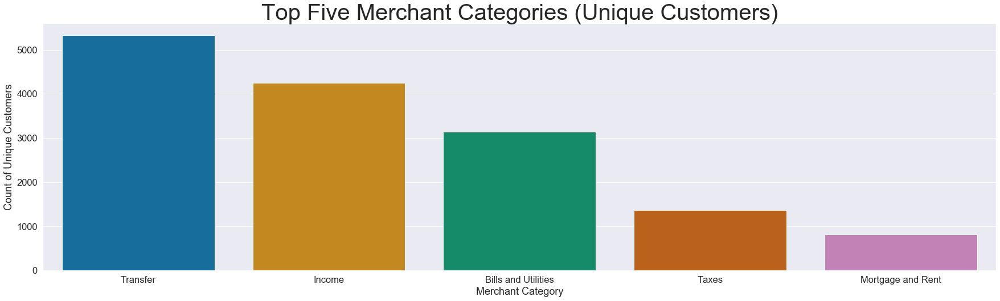

In [34]:
unique_tx_cust = df_tx.drop_duplicates(subset=['categoryTags', 'customerId'])

topCatUniq=sb.countplot(x='categoryTags', data=unique_tx_cust, palette='colorblind', 
             order=unique_tx_cust.categoryTags.value_counts().iloc[:5].index)
topCatUniq.set_title("Top Five Merchant Categories (Unique Customers)", fontsize=40)
topCatUniq.set_xlabel("Merchant Category")
topCatUniq.set_ylabel("Count of Unique Customers");

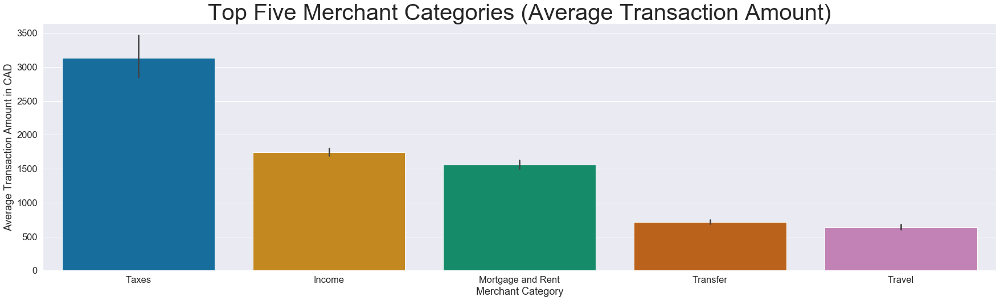

In [35]:
my_orderW = df_tx.groupby(by=['categoryTags'])['currencyAmount'].mean().sort_values(ascending=False).iloc[:5].index

topCatAmount=sb.barplot(x='categoryTags', y='currencyAmount', data=df_tx, palette='colorblind',
                  order=my_orderW)
topCatAmount.set_title("Top Five Merchant Categories (Average Transaction Amount)", fontsize=40)
topCatAmount.set_xlabel("Merchant Category")
topCatAmount.set_ylabel("Average Transaction Amount in CAD");

In [36]:
cust_modal_merchant = df_tx.groupby(['customerId'])['categoryTags'].agg(pd.Series.mode).to_frame()
cust_modal_merchant.reset_index(level=0, inplace=True)

In [37]:
tbs=df_tx.groupby(['customerId','categoryTags'])['currencyAmount'].sum().to_frame()
tbs.reset_index(level=0, inplace=True)
tbs.reset_index(level=0, inplace=True)

In [38]:
df_tx_income = pd.merge(tbs, df_custs[['id','totalIncome']], left_on='customerId', right_on='id')
df_tx_income = df_tx_income[(df_tx_income[['totalIncome']] != 0).all(axis=1)]
df_tx_income['totalMerchToIncome'] = df_tx_income['currencyAmount']/df_tx_income['totalIncome']

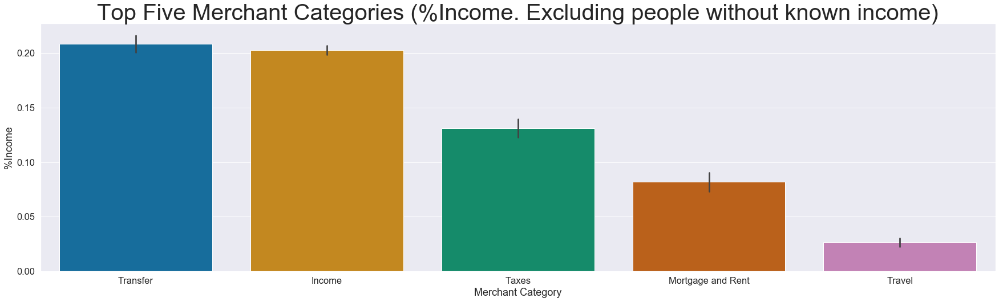

In [39]:
my_orderW = df_tx_income.groupby(by=['categoryTags'])['totalMerchToIncome'].mean().sort_values(ascending=False).iloc[:5].index

topCatIncome=sb.barplot(x='categoryTags', y='totalMerchToIncome', data=df_tx_income, palette='colorblind', order=my_orderW)
topCatIncome.set_title("Top Five Merchant Categories (%Income. Excluding people without known income)", fontsize=40)
topCatIncome.set_xlabel("Merchant Category")
topCatIncome.set_ylabel("%Income");

## Segments of Customers

### Extracting/computing and merging in one dataset all the variables of interest
In our final dataset, for each customer, we will extract/compute:
- work activity
- relationship status
- habitation status
- age (as of 2019-07-01 from their birthdate)
- total income
- balance (total from debit and savings accounts)
- number of transfers (because **Transfer** is our target category)
- average transfer amount (because **Transfer** is our target category)

In [40]:
df_custs_sub = df_custs[['id','birthDate', 'workActivity', 'totalIncome', 'relationshipStatus', 'habitationStatus']]
df_accts_b = df_accts[['cust_id','balance']]
df_accts_sub=df_accts_b.groupby(['cust_id'])['balance'].sum().to_frame()
df_custs_seg1 = pd.merge(df_custs_sub, df_accts_sub, left_on='id', right_on='cust_id')

In [41]:
df_tx_tr=df_tx[(df_tx['categoryTags']=="Transfer")]

n_tx=df_tx_tr['customerId'].value_counts().to_frame()
n_tx.reset_index(level=0, inplace=True)
n_tx.columns = ['customerId', 'numberTransfers']

a_tx = df_tx_tr[['customerId','currencyAmount']]
a_tx=a_tx.groupby(['customerId'])['currencyAmount'].mean().to_frame()
a_tx.reset_index(level=0, inplace=True)
a_tx.columns = ['customerId', 'averageTransferAmount']

df_custs_seg2 = pd.merge(df_custs_seg1, n_tx, how='left', left_on='id', right_on='customerId')
df_custs_final = pd.merge(df_custs_seg2, a_tx, how='left', left_on='id', right_on='customerId')

### Converting BirthDate to Age as of 2019-07-01

In [42]:
df_custs_final['age']=(datetime.strptime('2019-7-1', "%Y-%m-%d") - df_custs_final['birthDate'])
df_custs_final['age']=df_custs_final['age'].astype('timedelta64[D]').astype(int)
df_custs_final['age']=round(df_custs_final['age']/365.25)

### Dropping non-relevant columns and overview of final dataset

In [43]:
df_custs_final.drop(['id','birthDate','customerId_x','customerId_y'], axis=1, inplace=True)
df_custs_final.head()

,workActivity,totalIncome,relationshipStatus,habitationStatus,balance,numberTransfers,averageTransferAmount,age
0,NaN,0.0,Single,Group,0.00,5.0,1701.861000,34.0
1,fulltime,40009.2,Married,With Spouse,39306.34,9.0,162.564444,42.0
2,NaN,0.0,Single,With Parent,122.16,17.0,85.120118,16.0
3,fulltime,44709.0,Married,With Spouse,43687.72,7.0,2730.634286,36.0
4,fulltime,21496.0,Single,With Parent,23456.30,11.0,106.425455,36.0


In [44]:
print(df_custs_final.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5645 entries, 0 to 5644
Data columns (total 8 columns):
workActivity             4200 non-null object
totalIncome              5645 non-null float64
relationshipStatus       5645 non-null object
habitationStatus         4662 non-null object
balance                  5645 non-null float64
numberTransfers          5328 non-null float64
averageTransferAmount    5328 non-null float64
age                      5645 non-null float64
dtypes: float64(5), object(3)
memory usage: 396.9+ KB
None


### Filling in missing values
- 0 for numerical variables (number of transfers and average transfer amount)
- unknown for categorcal variables (work activity and habitation status)

In [45]:
df_custs_final['numberTransfers'] = df_custs_final['numberTransfers'].fillna(0)
df_custs_final['averageTransferAmount'] = df_custs_final['averageTransferAmount'].fillna(0)

df_custs_final['workActivity'] = df_custs_final['workActivity'].fillna('Unknown')
df_custs_final['habitationStatus'] = df_custs_final['habitationStatus'].fillna('Unknown')

df_custs_final.isna().sum().sum()    #checking for missing values after fill-in

0

### Heatmap correlation matrix of numerical variables

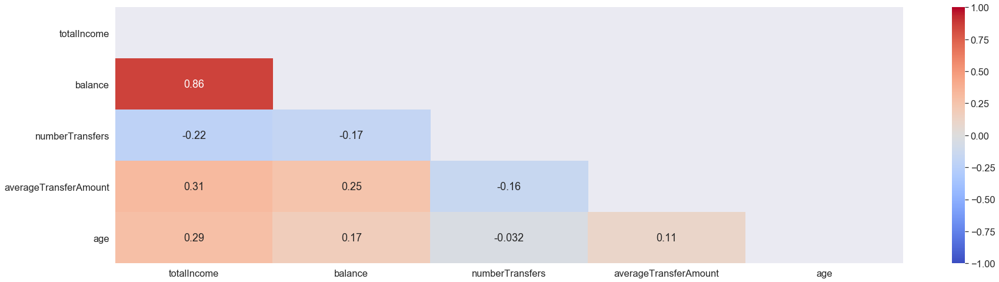

In [46]:
df_custs_final_num = df_custs_final[['totalIncome', 'balance', 'numberTransfers', 'averageTransferAmount', 'age']]
matrix = np.triu(df_custs_final_num.corr())
sb.heatmap(df_custs_final_num.corr(), annot = True, mask=matrix, vmin=-1, vmax=1, center= 0, cmap= 'coolwarm');

Since total income and balance are highly correlated (0.86), we will drop balance from our customer segmentation dataset because total income is the more reliable and consistent/stable feature between the two.

In [47]:
df_custs_final.drop(['balance'], axis=1, inplace=True)

### EDA

#### Overview of the categorical variables: class distribution

In [48]:
print("Unique values in each categorical column:")
for col in df_custs_final.select_dtypes(include=[object]):
    print(col,":", df_custs_final[col].unique())

Unique values in each categorical column:
workActivity : ['Unknown' 'fulltime' 'parttime']
relationshipStatus : ['Single' 'Married' 'Divorced' 'Widowed' 'Separated']
habitationStatus : ['Group' 'With Spouse' 'With Parent' 'Unknown']


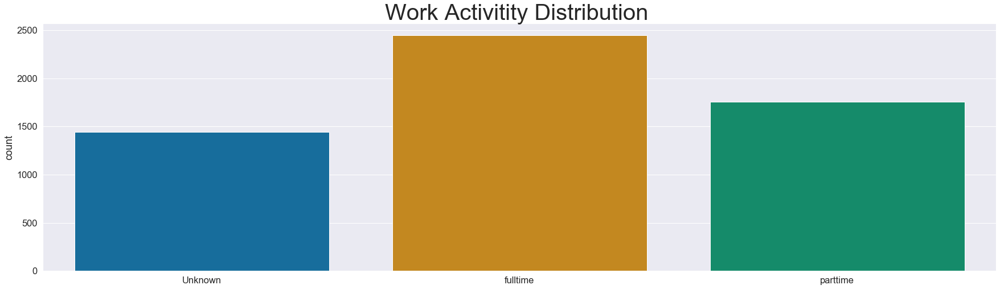

In [49]:
WA=sb.countplot(x='workActivity', data=df_custs_final, palette='colorblind')
WA.set_title("Work Activitity Distribution ", fontsize=40)
WA.set_xlabel("");

The number of customers working full-time outweighs the number of customers working part-time and those whose work acivity is unknown.

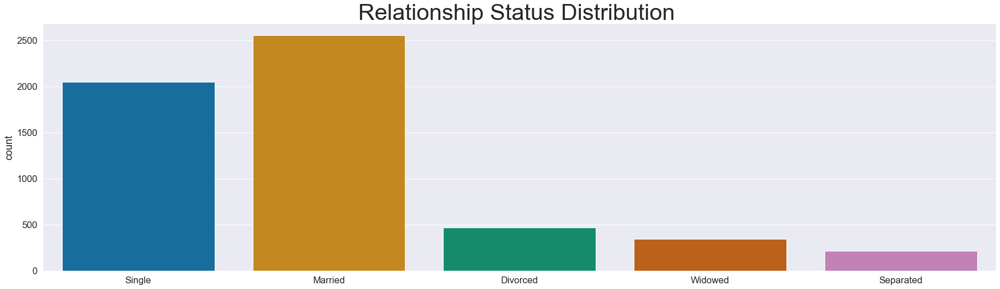

In [50]:
RS=sb.countplot(x='relationshipStatus', data=df_custs_final, palette='colorblind')
RS.set_title("Relationship Status Distribution ", fontsize=40)
RS.set_xlabel("");

The majority of the customeres are either married or single with slightly more married customers than single customers.

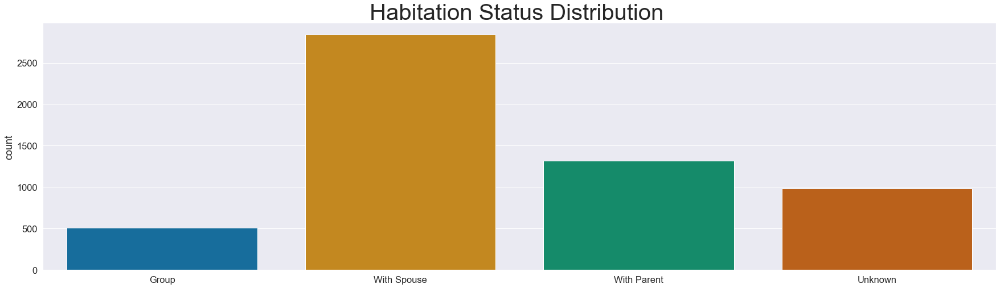

In [51]:
HS=sb.countplot(x='habitationStatus', data=df_custs_final, palette='colorblind')
HS.set_title("Habitation Status Distribution ", fontsize=40)
HS.set_xlabel("");

Almost half of the customers live with a spouse. Furthermore, The number of customers living with their spouse far outweights the other habitation status.

#### Overview of the numerical variables

##### Summary Statistics

In [52]:
df_custs_final.describe()

,totalIncome,numberTransfers,averageTransferAmount,age
count,5645.000000,5645.000000,5645.000000,5645.000000
mean,36322.587986,7.186005,1092.142986,47.072985
std,34982.078070,6.220133,2791.840725,19.705279
min,0.000000,0.000000,0.000000,14.000000
25%,12843.600000,3.000000,137.832500,31.000000
50%,28713.000000,6.000000,448.883017,45.000000
75%,48396.600000,10.000000,853.465000,61.000000
max,365126.300000,76.000000,49640.950000,107.000000


###### Distributions

In [53]:
def distributions(df):
    fig, axes = plt.subplots(2,2, figsize=(20,10))
    sb.distplot(df['age'], color="red", ax=axes[0,0])
    sb.distplot(df['totalIncome'], color="blue", ax=axes[0,1])
    sb.distplot(df['numberTransfers'], color="orange", ax=axes[1,0])
    c = sb.distplot(df['averageTransferAmount'], color="green", ax=axes[1,1])
    c.axes.set_xlim(0,10000)  #restricted axis for average transfer amount
    plt.tight_layout()

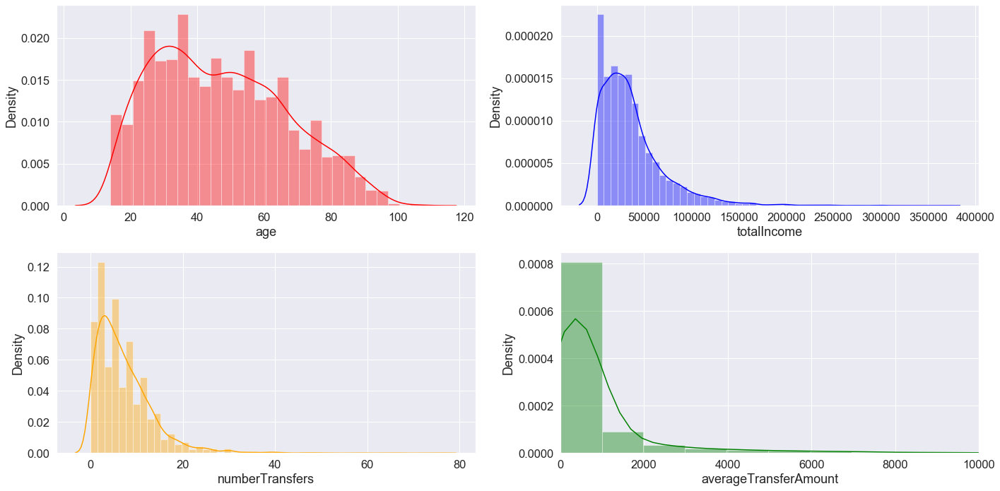

In [54]:
distributions(df_custs_final)

In [55]:
# uncomment lines below for boxplots
#fig, axes = plt.subplots(2, 2, figsize=(20, 10))
#sb.boxplot(y=df_custs_final['age'], color="red", ax=axes[0,0])
#sb.boxplot(y=df_custs_final['totalIncome'], color="blue", ax=axes[0,1])
#sb.boxplot(y=df_custs_final['numberTransfers'], color="orange", ax=axes[1,0])
#sb.boxplot(y=df_custs_final['averageTransferAmount'], color="green", ax=axes[1,1])
#plt.tight_layout()


# uncomment lines below for violinlots
#fig, axes = plt.subplots(2, 2, figsize=(20, 10))
#sb.violinplot(y=df_custs_final['age'], color="red", ax=axes[0,0])
#sb.violinplot(y=df_custs_final['totalIncome'], color="blue", ax=axes[0,1])
#sb.violinplot(y=df_custs_final['numberTransfers'], color="orange", ax=axes[1,0])
#sb.violinplot(y=df_custs_final['averageTransferAmount'], color="green", ax=axes[1,1])
#plt.tight_layout()

# uncomment lines below for histograms
#fig, axes = plt.subplots(2, 2, figsize=(20, 10))
#sb.histplot(df_custs_final['age'], color="red", ax=axes[0,0])
#sb.histplot(df_custs_final['totalIncome'], color="blue", ax=axes[0,1])
#sb.histplot(df_custs_final['numberTransfers'], color="orange", ax=axes[1,0])
#a = sb.histplot(df_custs_final['averageTransferAmount'], color="green", ax=axes[1,1])
#a.axes.set_xlim(0,10000)  #restricted x-axis after multiple zooming adjustations
#plt.tight_layout()

#### Scatter plots of the numerical variables stratified by the categorical variables

In [56]:
def scatters(df, h=None, s=None, pal='colorblind'):
    fig, axes = plt.subplots(3,2, figsize=(25,20))
    sb.scatterplot(x="numberTransfers", y="totalIncome", s=80, hue=h, style=s, palette=pal, data=df, ax=axes[0,0])
    a = sb.scatterplot(x="averageTransferAmount", y="totalIncome", s=80, hue=h, style=s, palette=pal, data=df, legend=False, ax=axes[1,0])
    a.axes.set_xlim(0,10000)  #restricted axis for average transfer amount
    sb.scatterplot(x="age", y="totalIncome", s=80, hue=h, palette=pal, data=df, legend=False, ax=axes[2,0])
    b = sb.scatterplot(x="averageTransferAmount", y="numberTransfers", s=80, hue=h, style=s, palette=pal, data=df, legend=False, ax=axes[0,1])
    b.axes.set_xlim(0,10000)  #restricted axis for average transfer amount
    sb.scatterplot(x="age", y="numberTransfers", s=80, hue=h, style=s, palette=pal, data=df, legend=False, ax=axes[1,1])
    c = sb.scatterplot(x="age", y="averageTransferAmount", s=80, hue=h, style=s, palette=pal, data=df, legend=False, ax=axes[2,1])
    c.axes.set_ylim(0,10000)  #restricted axis for average transfer amount
    plt.tight_layout()

##### By Work Activity

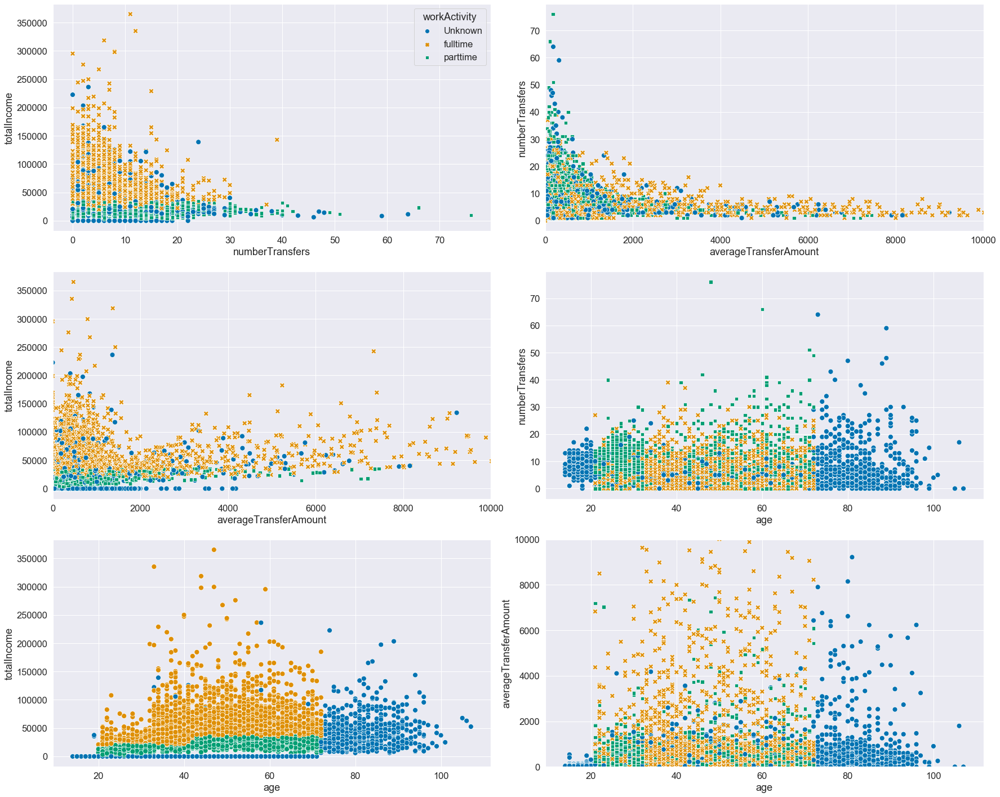

In [57]:
scatters(df_custs_final, h="workActivity", s="workActivity")

- As expected, customers working full-time earn more than those working part-time.
- Customers with unknown work activity are mostly  under 20 and over 70 years old. Hence they are probably not in the workforce yet or are already retired.
- The segment of younger customers is majoritarily comprised by customers working part-time or with unknown work activity.
- Although the extremely high 'number of transfers' are done by part-timers and customers with unknown work activity, and the extremely high 'average transfer amount' are done by full-time and unknown work activity customers, generally there is no clear difference between full-time, part-time and unknow activity customers in terms of number of transfers and average transfer amount.

##### By Relationship Status

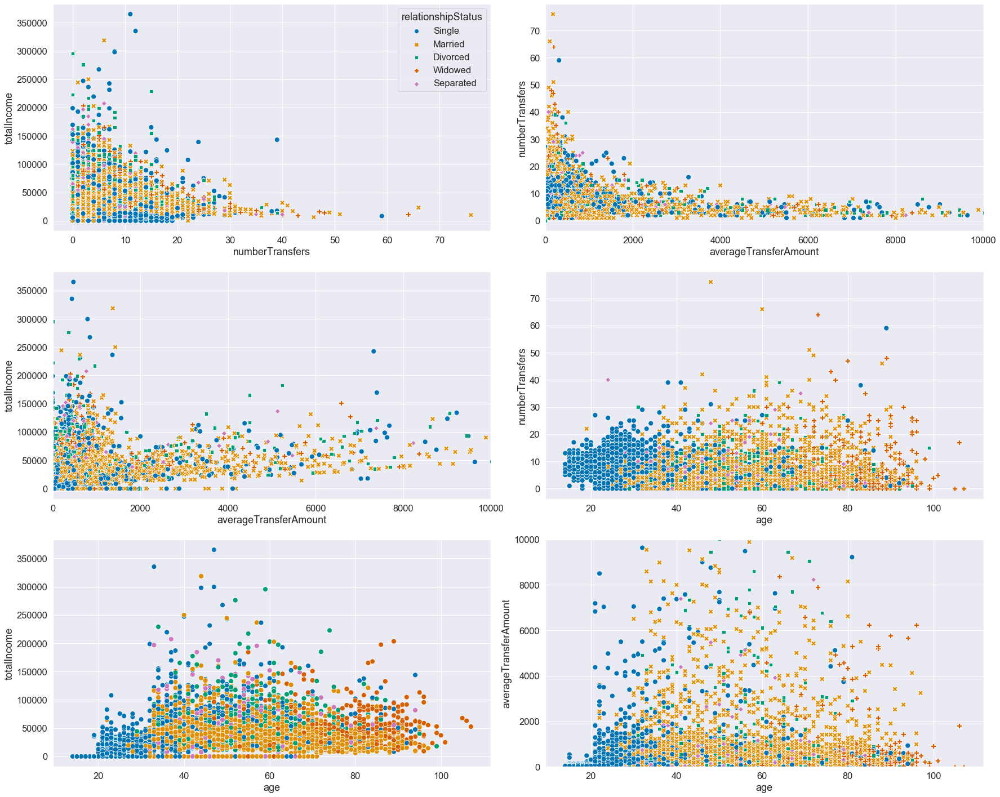

In [58]:
scatters(df_custs_final, h="relationshipStatus", s="relationshipStatus")

- As expected, single customers are mostly young, widowed customers are mostly old, and married customers are mostly in working age.
- Generally there is no clear difference between the different relationship status in terms of total income, number of transfers and average transfer amount.

##### By Habitation Status

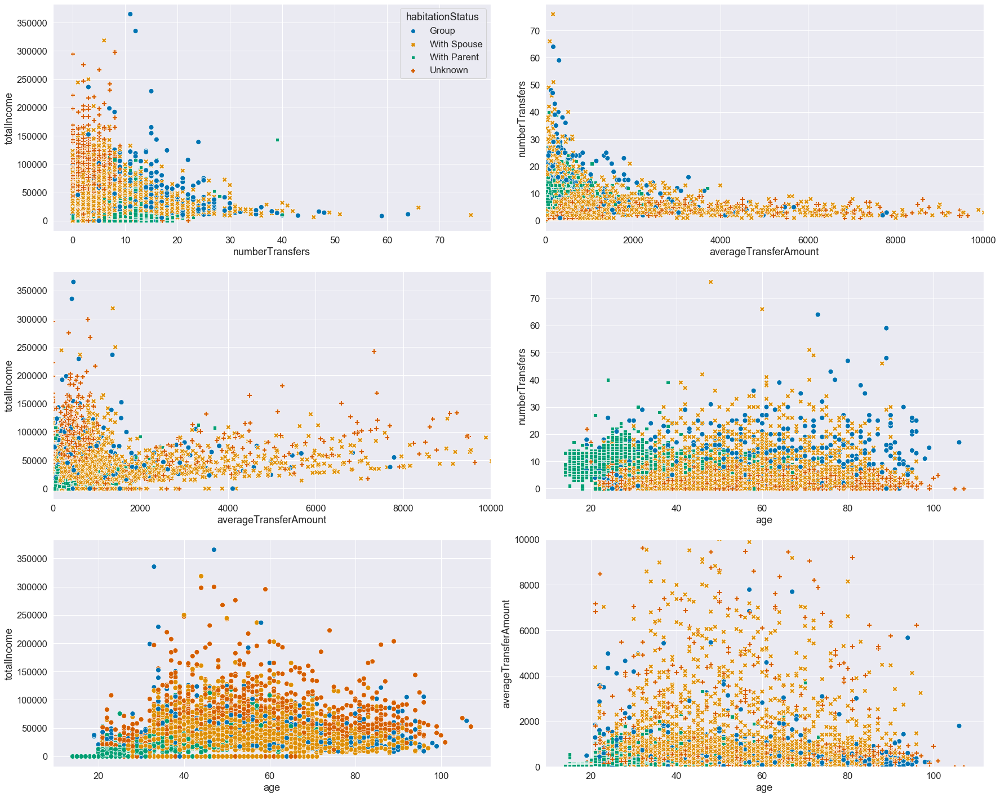

In [59]:
scatters(df_custs_final, h="habitationStatus", s="habitationStatus")

- As expected, customers living with parent are mostly young. They also earn less income and transfer low to moderate amount of money.
- Except for customers living with parent, generally there is no clear difference between the different habitation status in terms of age, total income, number of transfers and average transfer amount.

### K-means Clustering

In [60]:
#Selecting columns/features for clusterisation with K-means
selected_cols = ["age", "totalIncome", "numberTransfers", "averageTransferAmount"]
cluster_data = df_custs_final.loc[:,selected_cols]

#### Transformation (logarithmic)
Because the distributions of our numerical variables are right-skewed (see above), we applied logarithmic transformation. After transformation, the skewness is not totally eliminated but it is better now.

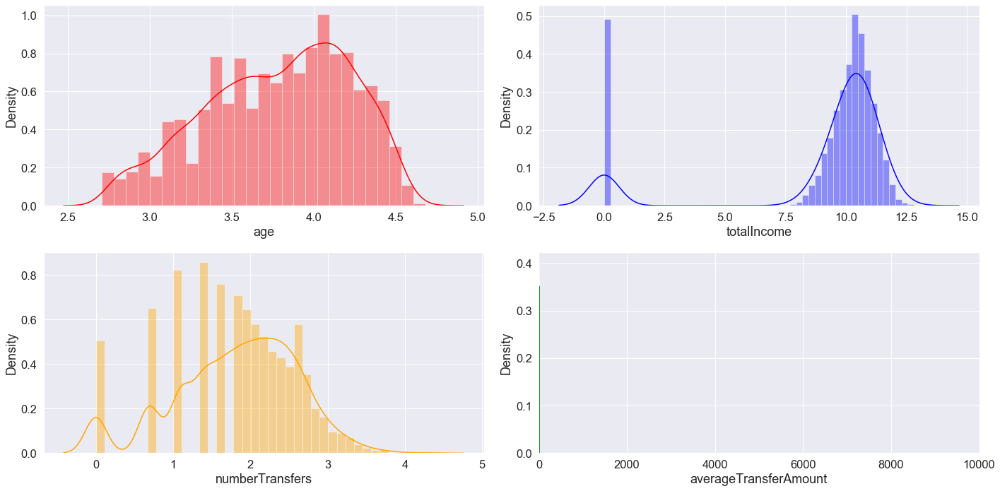

In [61]:
cluster_log = np.log(cluster_data+1) # We added 1 because we have some zeros
distributions(cluster_log)

#### Scaling
K-means is a distance based algorithm. Hence feature-scaling is needed.

In [62]:
scaler = StandardScaler()
cluster_scaled = scaler.fit_transform(cluster_log)

 #### Finding the optimal K or number of clusters using the silhouette method
 Optimal K=3

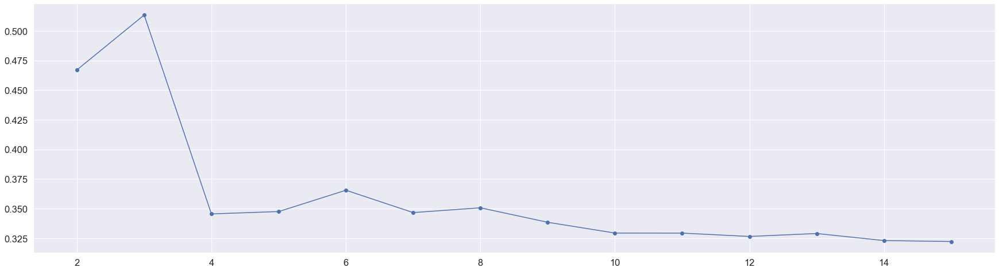

In [63]:
sil = []
kmax = 15

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax+1):
  kmeans = KMeans(n_clusters = k, random_state=123).fit(cluster_scaled)
  labels = kmeans.labels_
  sil.append(silhouette_score(cluster_scaled, labels, metric = 'euclidean'))

plt.figure()
plt.plot(range(2, kmax+1),sil, marker='o');

#### Run K-means with K=3

In [64]:
kmeans_sel = KMeans(n_clusters=3, random_state=123).fit(cluster_scaled)
labels = pd.DataFrame(kmeans_sel.labels_)
clustered_data = cluster_data.assign(Cluster=labels)

#### Characteristics of identified clusters (K=3, 3 segments)

In [65]:
grouped_km = clustered_data.groupby(['Cluster']).mean().round(1)
grouped_km

,age,totalIncome,numberTransfers,averageTransferAmount
Cluster,,,,
0,29.1,0.0,7.3,339.8
1,49.4,41040.6,7.7,1278.9
2,51.4,45921.3,0.0,0.2


We identified three segments of customers:
- Segment 1: Young customers with no income, average number of transfers (7-8) and low average transfer amount (339 CAD, below average). This group most certainly includes customers living with parent and is majoritarily comprised by customers working part-time or with unknown work activity.
- Segment 2: Middle-aged customers with middle class income, average number of transfers (7-8) and high average transfer amount (1278 CAD, slightly above average).  Based on the EDA , the typical profile of a customer in this segment is: married, living with a spouse and working full-time.
- Segment 3: Middle-aged customers with middle class income, no transfer history and very low average transfer amount.

#### 2-d and 3-d viualizations for K=3 (3 segments)

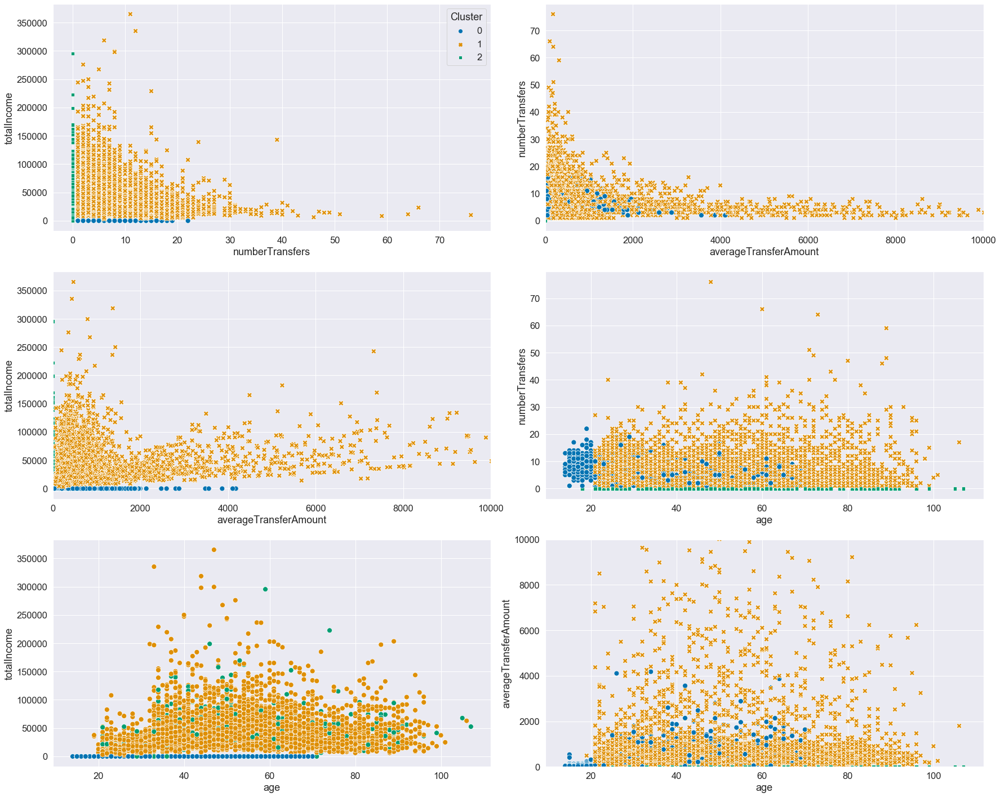

In [66]:
scatters(clustered_data, h='Cluster', s='Cluster')

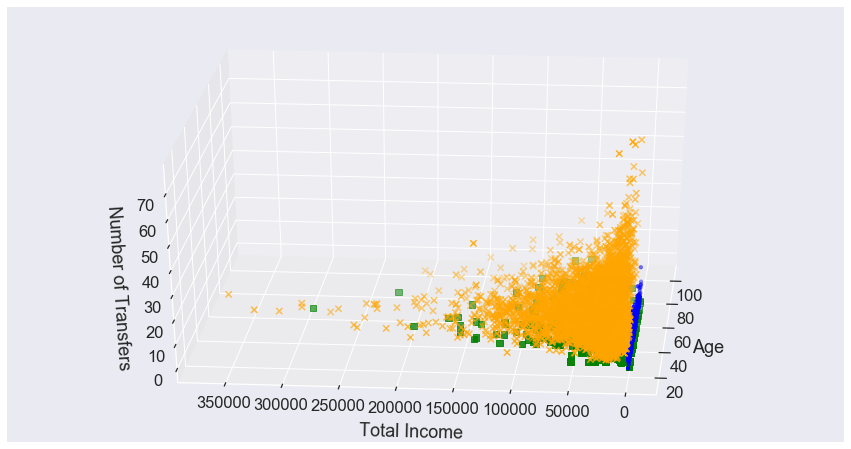

In [67]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(clustered_data.age[clustered_data.Cluster == 0], clustered_data["totalIncome"][clustered_data.Cluster == 0], clustered_data["numberTransfers"][clustered_data.Cluster == 0], c='blue', marker='.', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 1], clustered_data["totalIncome"][clustered_data.Cluster == 1], clustered_data["numberTransfers"][clustered_data.Cluster == 1], c='orange', marker='x', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 2], clustered_data["totalIncome"][clustered_data.Cluster == 2], clustered_data["numberTransfers"][clustered_data.Cluster == 2], c='green', marker='s', s=40)

ax.view_init(30, 185)
plt.xlabel("Age", labelpad=10)
plt.ylabel("Total Income", labelpad=20)
ax.set_zlabel('Number of Transfers', labelpad=10)
plt.show()

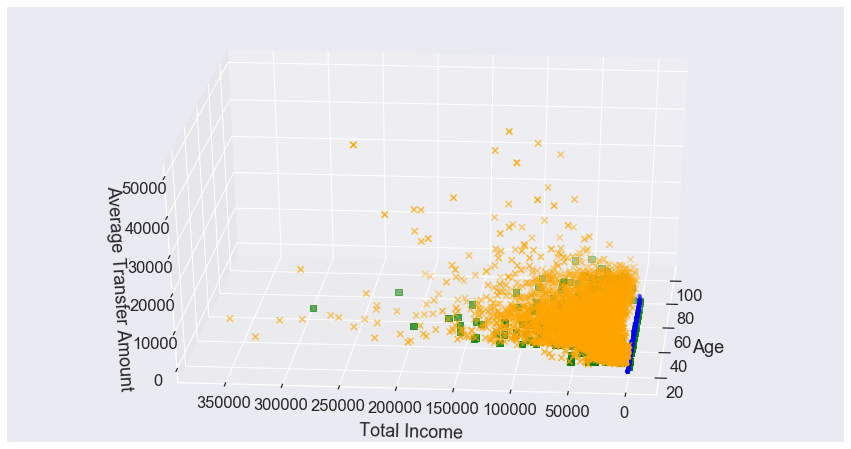

In [68]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(clustered_data.age[clustered_data.Cluster == 0], clustered_data["totalIncome"][clustered_data.Cluster == 0], clustered_data["averageTransferAmount"][clustered_data.Cluster == 0], c='blue', marker='.', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 1], clustered_data["totalIncome"][clustered_data.Cluster == 1], clustered_data["averageTransferAmount"][clustered_data.Cluster == 1], c='orange', marker='x', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 2], clustered_data["totalIncome"][clustered_data.Cluster == 2], clustered_data["averageTransferAmount"][clustered_data.Cluster == 2], c='green', marker='s', s=40)

ax.view_init(30, 185)
plt.xlabel("Age", labelpad=10)
plt.ylabel("Total Income", labelpad=20)
ax.set_zlabel('Average Transfer Amount', labelpad=10)
plt.show()

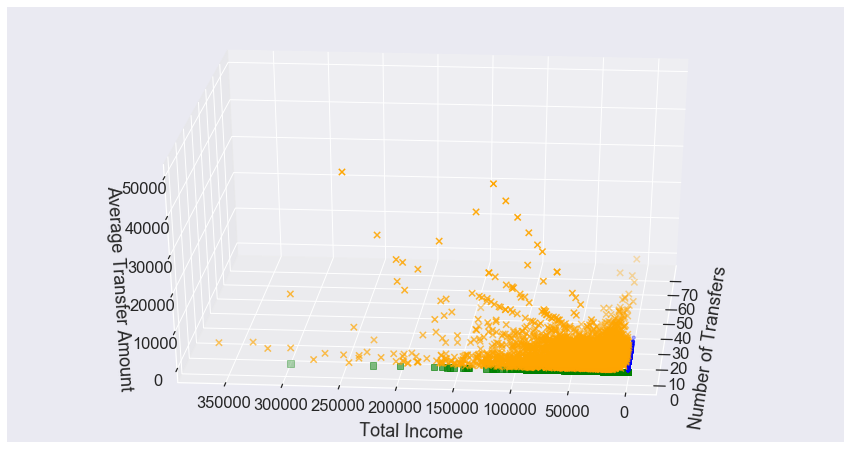

In [69]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(clustered_data.numberTransfers[clustered_data.Cluster == 0], clustered_data["totalIncome"][clustered_data.Cluster == 0], clustered_data["averageTransferAmount"][clustered_data.Cluster == 0], c='blue', marker='.', s=40)
ax.scatter(clustered_data.numberTransfers[clustered_data.Cluster == 1], clustered_data["totalIncome"][clustered_data.Cluster == 1], clustered_data["averageTransferAmount"][clustered_data.Cluster == 1], c='orange', marker='x', s=40)
ax.scatter(clustered_data.numberTransfers[clustered_data.Cluster == 2], clustered_data["totalIncome"][clustered_data.Cluster == 2], clustered_data["averageTransferAmount"][clustered_data.Cluster == 2], c='green', marker='s', s=40)

ax.view_init(30, 185)
plt.xlabel("Number of Transfers", labelpad=10)
plt.ylabel("Total Income", labelpad=20)
ax.set_zlabel('Average Transfer Amount', labelpad=10)
plt.show()

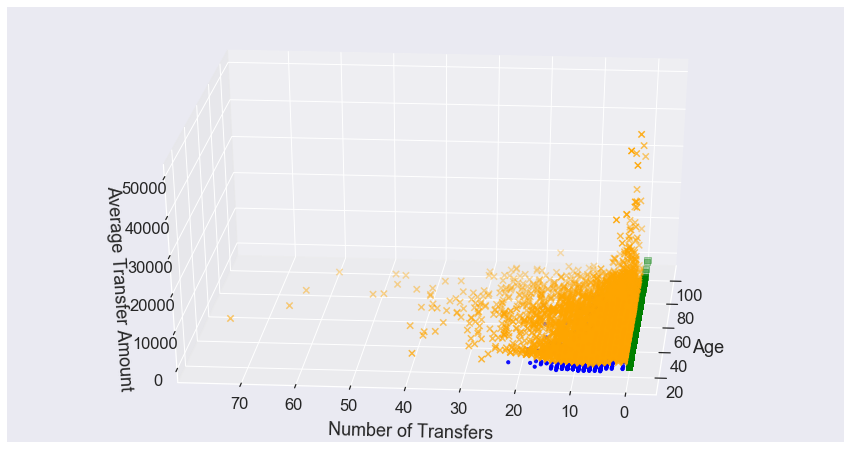

In [70]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(clustered_data.age[clustered_data.Cluster == 0], clustered_data["numberTransfers"][clustered_data.Cluster == 0], clustered_data["averageTransferAmount"][clustered_data.Cluster == 0], c='blue', marker='.', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 1], clustered_data["numberTransfers"][clustered_data.Cluster == 1], clustered_data["averageTransferAmount"][clustered_data.Cluster == 1], c='orange', marker='x', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 2], clustered_data["numberTransfers"][clustered_data.Cluster == 2], clustered_data["averageTransferAmount"][clustered_data.Cluster == 2], c='green', marker='s', s=40)

ax.view_init(30, 185)
plt.xlabel("Age", labelpad=10)
plt.ylabel("Number of Transfers", labelpad=20)
ax.set_zlabel('Average Transfer Amount', labelpad=10)
plt.show()

 #### Finding the optimal K or number of clusters using the elbow method
 The elbow method does not provide a clear cut answer about the optimal K. It can be either 3, 4, or 5. Since We have always tried K=3, we will take a shot at K=4, and K=5.

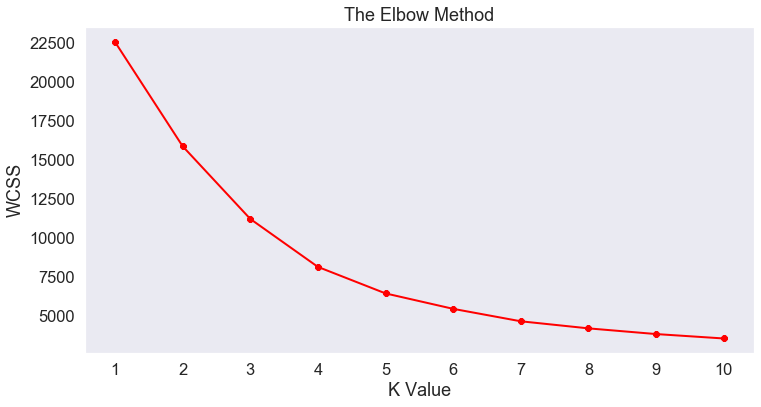

In [71]:
#Elbow Method

wcss = []
for k in range(1,11):
    kmeans = KMeans(n_clusters=k, random_state=123)
    kmeans.fit(cluster_scaled)
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(12,6))    
plt.grid()
plt.title('The Elbow Method')
plt.plot(range(1,11),wcss, linewidth=2, color="red", marker ="8")
plt.xlabel("K Value")
plt.xticks(np.arange(1,11,1))
plt.ylabel("WCSS")
plt.show()

#### Run K-means with K=4

In [72]:
kmeans_sel = KMeans(n_clusters=4, random_state=123).fit(cluster_scaled)
labels = pd.DataFrame(kmeans_sel.labels_)
clustered_data = cluster_data.assign(Cluster=labels)

#### Characteristics of identified clusters (K=4, 4 segments)

In [73]:
grouped_km = clustered_data.groupby(['Cluster']).mean().round(1)
grouped_km

,age,totalIncome,numberTransfers,averageTransferAmount
Cluster,,,,
0,51.2,46016.5,0.0,0.1
1,55.8,51849.4,3.8,2002.3
2,29.1,0.0,7.3,339.8
3,42.0,28351.7,12.2,429.9


#### 2-d and 3-d viualizations for K=4 (4 segments)

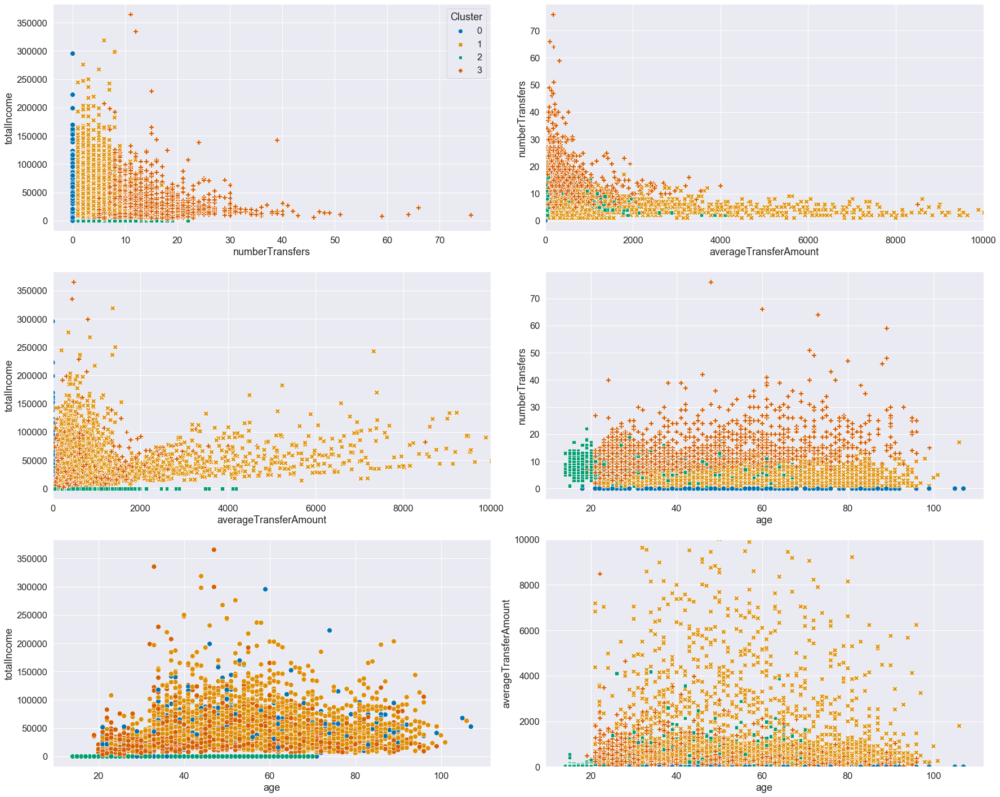

In [74]:
scatters(clustered_data, h='Cluster', s='Cluster')

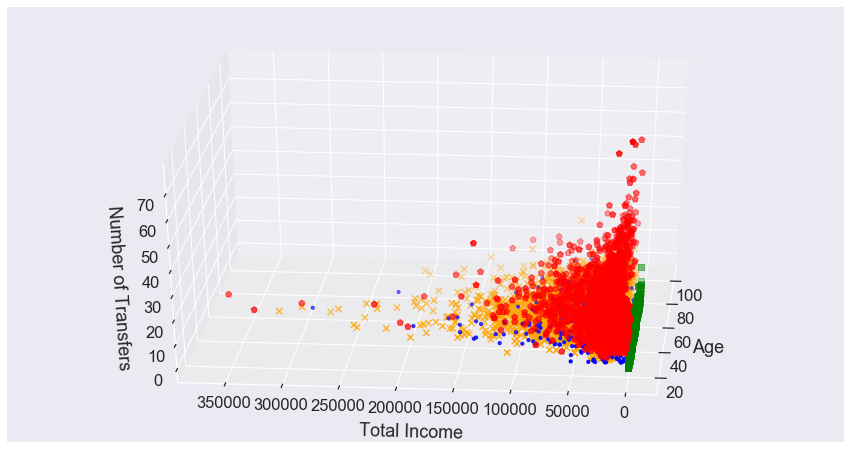

In [75]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(clustered_data.age[clustered_data.Cluster == 0], clustered_data["totalIncome"][clustered_data.Cluster == 0], clustered_data["numberTransfers"][clustered_data.Cluster == 0], c='blue', marker='.', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 1], clustered_data["totalIncome"][clustered_data.Cluster == 1], clustered_data["numberTransfers"][clustered_data.Cluster == 1], c='orange', marker='x', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 2], clustered_data["totalIncome"][clustered_data.Cluster == 2], clustered_data["numberTransfers"][clustered_data.Cluster == 2], c='green', marker='s', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 3], clustered_data["totalIncome"][clustered_data.Cluster == 3], clustered_data["numberTransfers"][clustered_data.Cluster == 3], c='red', marker='p', s=40)

ax.view_init(30, 185)
plt.xlabel("Age", labelpad=10)
plt.ylabel("Total Income", labelpad=20)
ax.set_zlabel('Number of Transfers', labelpad=10)
plt.show()

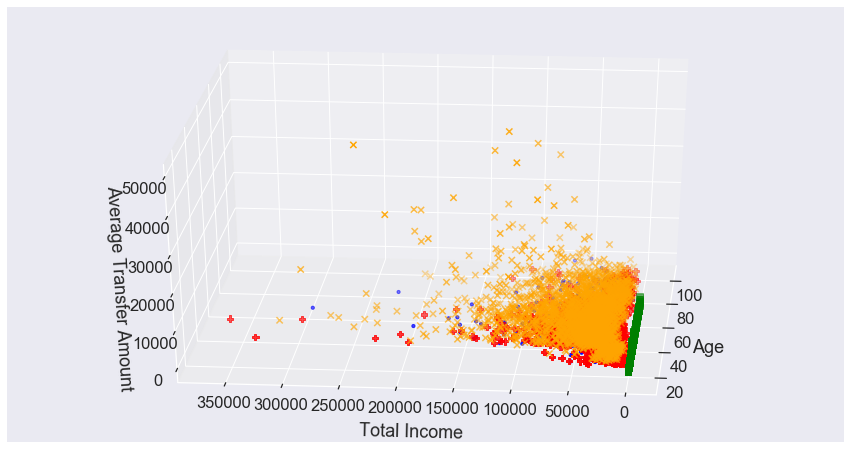

In [76]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(clustered_data.age[clustered_data.Cluster == 0], clustered_data["totalIncome"][clustered_data.Cluster == 0], clustered_data["averageTransferAmount"][clustered_data.Cluster == 0], c='blue', marker='.', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 1], clustered_data["totalIncome"][clustered_data.Cluster == 1], clustered_data["averageTransferAmount"][clustered_data.Cluster == 1], c='orange', marker='x', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 2], clustered_data["totalIncome"][clustered_data.Cluster == 2], clustered_data["averageTransferAmount"][clustered_data.Cluster == 2], c='green', marker='s', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 3], clustered_data["totalIncome"][clustered_data.Cluster == 3], clustered_data["averageTransferAmount"][clustered_data.Cluster == 3], c='red', marker='P', s=40)

ax.view_init(30, 185)
plt.xlabel("Age", labelpad=10)
plt.ylabel("Total Income", labelpad=20)
ax.set_zlabel('Average Transfer Amount', labelpad=10)
plt.show()

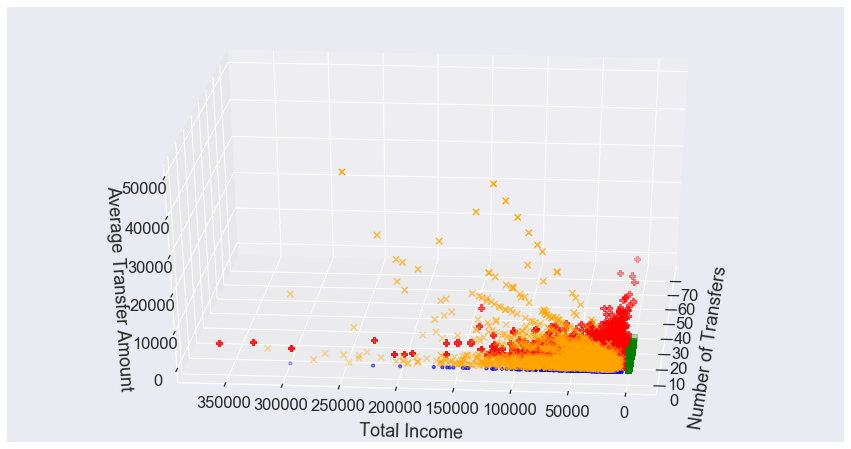

In [77]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(clustered_data.numberTransfers[clustered_data.Cluster == 0], clustered_data["totalIncome"][clustered_data.Cluster == 0], clustered_data["averageTransferAmount"][clustered_data.Cluster == 0], c='blue', marker='.', s=40)
ax.scatter(clustered_data.numberTransfers[clustered_data.Cluster == 1], clustered_data["totalIncome"][clustered_data.Cluster == 1], clustered_data["averageTransferAmount"][clustered_data.Cluster == 1], c='orange', marker='x', s=40)
ax.scatter(clustered_data.numberTransfers[clustered_data.Cluster == 2], clustered_data["totalIncome"][clustered_data.Cluster == 2], clustered_data["averageTransferAmount"][clustered_data.Cluster == 2], c='green', marker='s', s=40)
ax.scatter(clustered_data.numberTransfers[clustered_data.Cluster == 3], clustered_data["totalIncome"][clustered_data.Cluster == 3], clustered_data["averageTransferAmount"][clustered_data.Cluster == 3], c='red', marker='P', s=40)

ax.view_init(30, 185)
plt.xlabel("Number of Transfers", labelpad=10)
plt.ylabel("Total Income", labelpad=20)
ax.set_zlabel('Average Transfer Amount', labelpad=10)
plt.show()

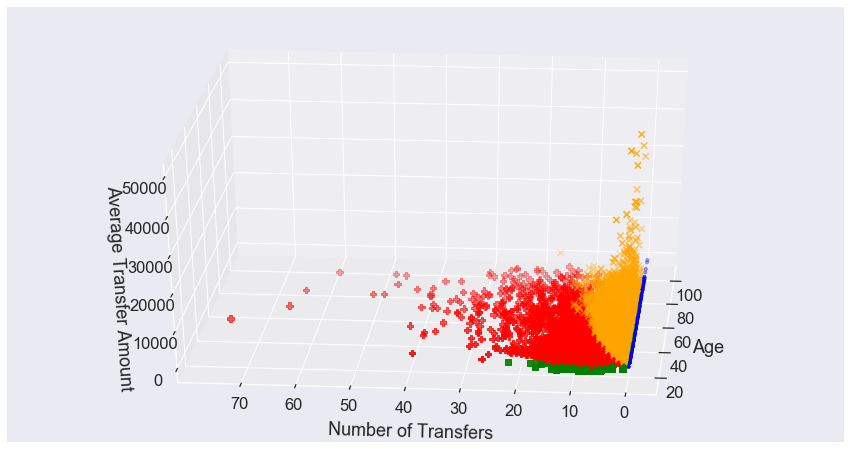

In [78]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(clustered_data.age[clustered_data.Cluster == 0], clustered_data["numberTransfers"][clustered_data.Cluster == 0], clustered_data["averageTransferAmount"][clustered_data.Cluster == 0], c='blue', marker='.', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 1], clustered_data["numberTransfers"][clustered_data.Cluster == 1], clustered_data["averageTransferAmount"][clustered_data.Cluster == 1], c='orange', marker='x', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 2], clustered_data["numberTransfers"][clustered_data.Cluster == 2], clustered_data["averageTransferAmount"][clustered_data.Cluster == 2], c='green', marker='s', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 3], clustered_data["numberTransfers"][clustered_data.Cluster == 3], clustered_data["averageTransferAmount"][clustered_data.Cluster == 3], c='red', marker='P', s=40)

ax.view_init(30, 185)
plt.xlabel("Age", labelpad=10)
plt.ylabel("Number of Transfers", labelpad=20)
ax.set_zlabel('Average Transfer Amount', labelpad=10)
plt.show()

#### Run K-means with K=5

In [79]:
kmeans_sel = KMeans(n_clusters=5, random_state=123).fit(cluster_scaled)
labels = pd.DataFrame(kmeans_sel.labels_)
clustered_data = cluster_data.assign(Cluster=labels)

#### Characteristics of identified clusters (K=5, 5 segments)

In [80]:
grouped_km = clustered_data.groupby(['Cluster']).mean().round(1)
grouped_km

,age,totalIncome,numberTransfers,averageTransferAmount
Cluster,,,,
0,51.2,46016.5,0.0,0.1
1,62.7,38542.3,13.6,511.2
2,29.1,0.0,7.3,339.8
3,29.6,23051.3,8.9,521.9
4,55.7,55541.1,3.1,2294.3


#### 2-d and 3-d viualizations for K=5 (5 segments)

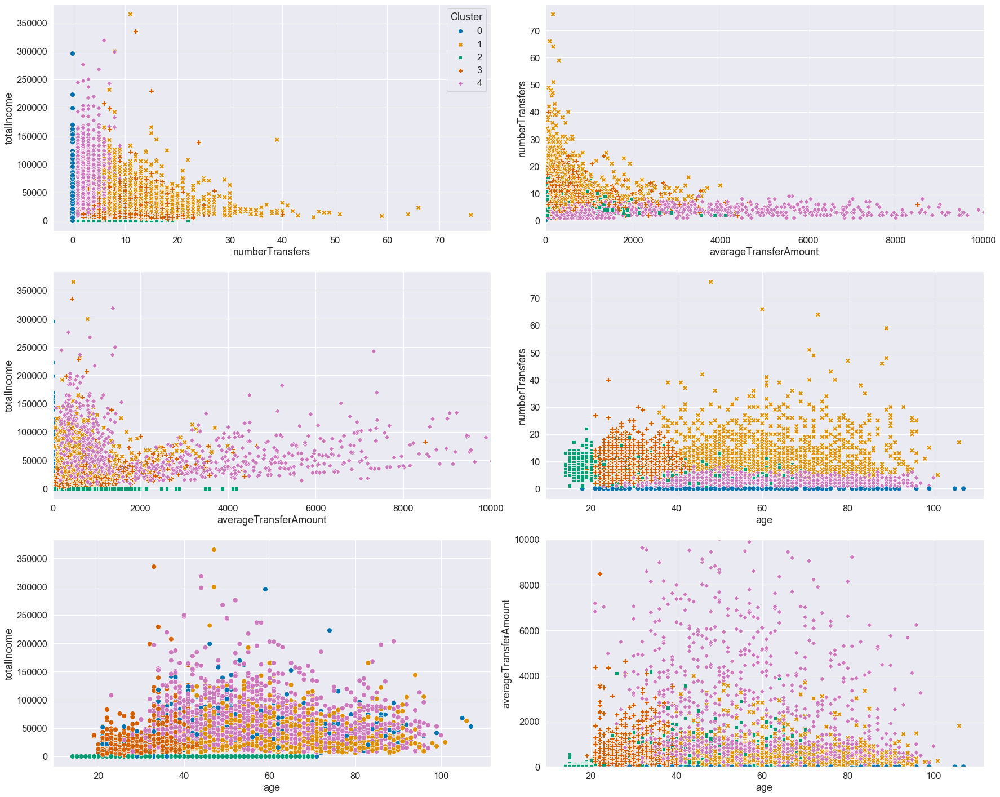

In [81]:
scatters(clustered_data, h='Cluster', s='Cluster')

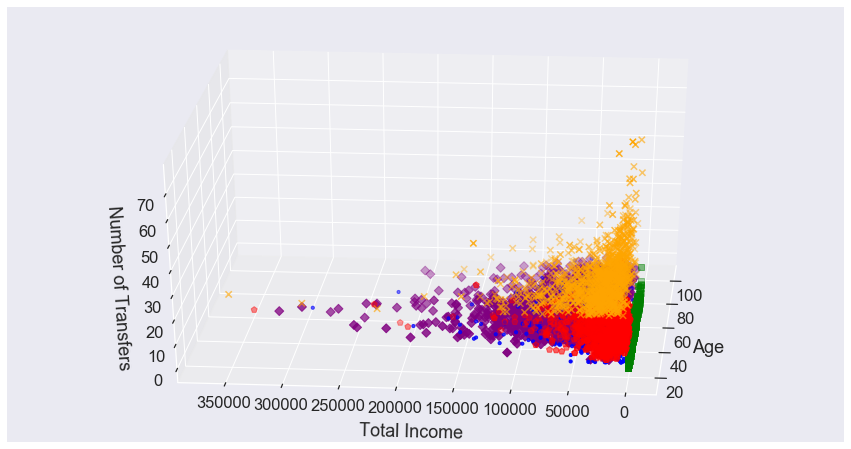

In [82]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(clustered_data.age[clustered_data.Cluster == 0], clustered_data["totalIncome"][clustered_data.Cluster == 0], clustered_data["numberTransfers"][clustered_data.Cluster == 0], c='blue', marker='.', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 1], clustered_data["totalIncome"][clustered_data.Cluster == 1], clustered_data["numberTransfers"][clustered_data.Cluster == 1], c='orange', marker='x', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 2], clustered_data["totalIncome"][clustered_data.Cluster == 2], clustered_data["numberTransfers"][clustered_data.Cluster == 2], c='green', marker='s', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 3], clustered_data["totalIncome"][clustered_data.Cluster == 3], clustered_data["numberTransfers"][clustered_data.Cluster == 3], c='red', marker='p', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 4], clustered_data["totalIncome"][clustered_data.Cluster == 4], clustered_data["numberTransfers"][clustered_data.Cluster == 4], c='purple', marker='D', s=40)

ax.view_init(30, 185)
plt.xlabel("Age", labelpad=10)
plt.ylabel("Total Income", labelpad=20)
ax.set_zlabel('Number of Transfers', labelpad=10)
plt.show()

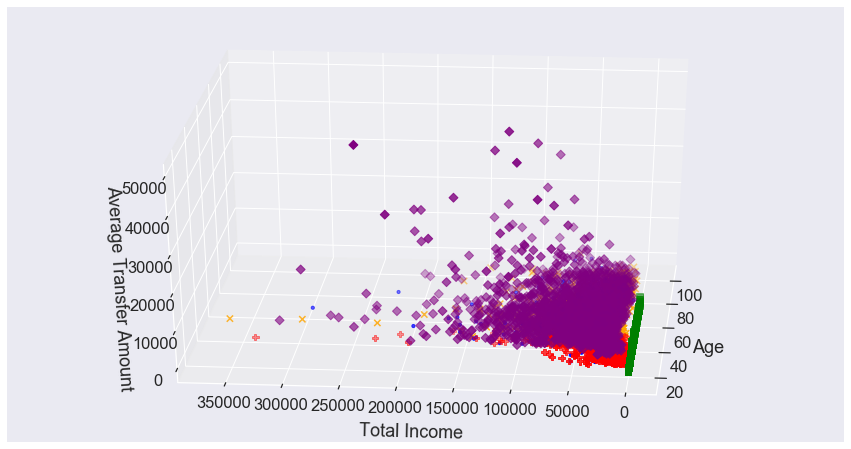

In [83]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(clustered_data.age[clustered_data.Cluster == 0], clustered_data["totalIncome"][clustered_data.Cluster == 0], clustered_data["averageTransferAmount"][clustered_data.Cluster == 0], c='blue', marker='.', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 1], clustered_data["totalIncome"][clustered_data.Cluster == 1], clustered_data["averageTransferAmount"][clustered_data.Cluster == 1], c='orange', marker='x', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 2], clustered_data["totalIncome"][clustered_data.Cluster == 2], clustered_data["averageTransferAmount"][clustered_data.Cluster == 2], c='green', marker='s', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 3], clustered_data["totalIncome"][clustered_data.Cluster == 3], clustered_data["averageTransferAmount"][clustered_data.Cluster == 3], c='red', marker='P', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 4], clustered_data["totalIncome"][clustered_data.Cluster == 4], clustered_data["averageTransferAmount"][clustered_data.Cluster == 4], c='purple', marker='D', s=40)

ax.view_init(30, 185)
plt.xlabel("Age", labelpad=10)
plt.ylabel("Total Income", labelpad=20)
ax.set_zlabel('Average Transfer Amount', labelpad=10)
plt.show()

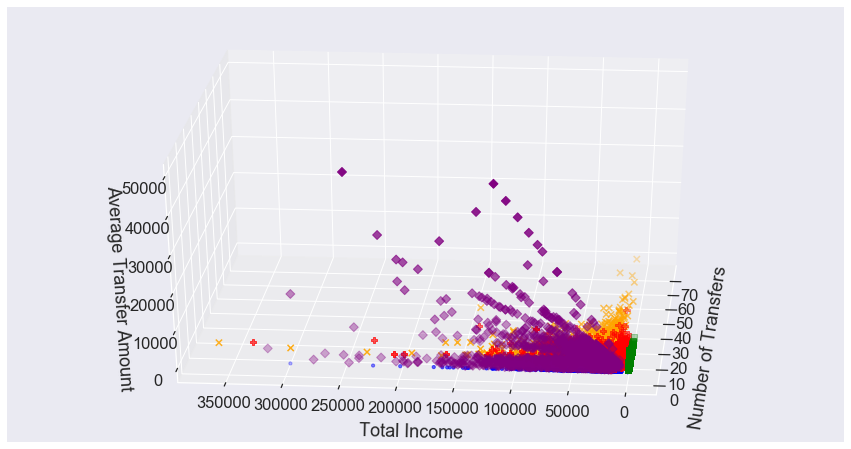

In [84]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(clustered_data.numberTransfers[clustered_data.Cluster == 0], clustered_data["totalIncome"][clustered_data.Cluster == 0], clustered_data["averageTransferAmount"][clustered_data.Cluster == 0], c='blue', marker='.', s=40)
ax.scatter(clustered_data.numberTransfers[clustered_data.Cluster == 1], clustered_data["totalIncome"][clustered_data.Cluster == 1], clustered_data["averageTransferAmount"][clustered_data.Cluster == 1], c='orange', marker='x', s=40)
ax.scatter(clustered_data.numberTransfers[clustered_data.Cluster == 2], clustered_data["totalIncome"][clustered_data.Cluster == 2], clustered_data["averageTransferAmount"][clustered_data.Cluster == 2], c='green', marker='s', s=40)
ax.scatter(clustered_data.numberTransfers[clustered_data.Cluster == 3], clustered_data["totalIncome"][clustered_data.Cluster == 3], clustered_data["averageTransferAmount"][clustered_data.Cluster == 3], c='red', marker='P', s=40)
ax.scatter(clustered_data.numberTransfers[clustered_data.Cluster == 4], clustered_data["totalIncome"][clustered_data.Cluster == 4], clustered_data["averageTransferAmount"][clustered_data.Cluster == 4], c='purple', marker='D', s=40)

ax.view_init(30, 185)
plt.xlabel("Number of Transfers", labelpad=10)
plt.ylabel("Total Income", labelpad=20)
ax.set_zlabel('Average Transfer Amount', labelpad=10)
plt.show()

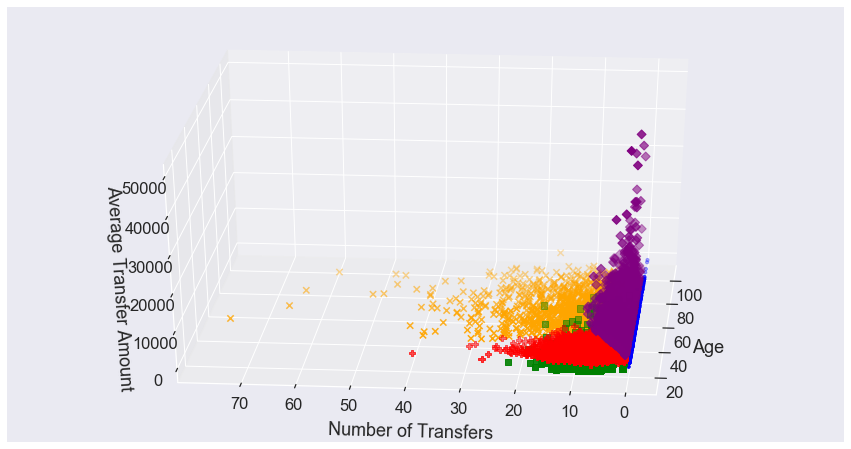

In [85]:
fig = plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(clustered_data.age[clustered_data.Cluster == 0], clustered_data["numberTransfers"][clustered_data.Cluster == 0], clustered_data["averageTransferAmount"][clustered_data.Cluster == 0], c='blue', marker='.', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 1], clustered_data["numberTransfers"][clustered_data.Cluster == 1], clustered_data["averageTransferAmount"][clustered_data.Cluster == 1], c='orange', marker='x', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 2], clustered_data["numberTransfers"][clustered_data.Cluster == 2], clustered_data["averageTransferAmount"][clustered_data.Cluster == 2], c='green', marker='s', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 3], clustered_data["numberTransfers"][clustered_data.Cluster == 3], clustered_data["averageTransferAmount"][clustered_data.Cluster == 3], c='red', marker='P', s=40)
ax.scatter(clustered_data.age[clustered_data.Cluster == 4], clustered_data["numberTransfers"][clustered_data.Cluster == 4], clustered_data["averageTransferAmount"][clustered_data.Cluster == 4], c='purple', marker='D', s=40)

ax.view_init(30, 185)
plt.xlabel("Age", labelpad=10)
plt.ylabel("Number of Transfers", labelpad=20)
ax.set_zlabel('Average Transfer Amount', labelpad=10)
plt.show()

# Extra Code

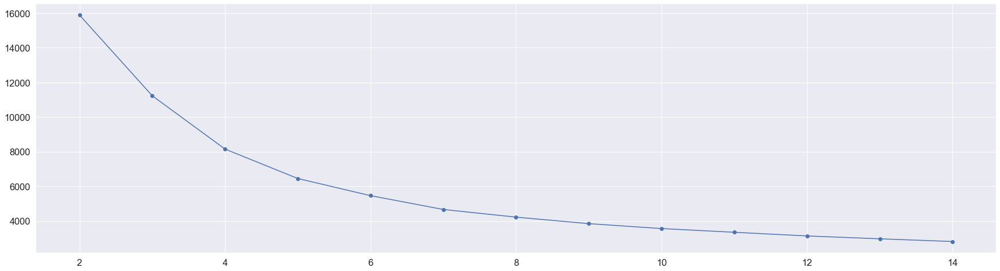

In [86]:
#Inertia decrease check
clusters_range = [2,3,4,5,6,7,8,9,10,11,12,13,14]
inertias =[]

for c in clusters_range:
    kmeans = KMeans(n_clusters=c, random_state=0).fit(cluster_scaled)
    inertias.append(kmeans.inertia_)

plt.figure()
plt.plot(clusters_range,inertias, marker='o');